In [1]:
import os
from pathlib import Path
import cv2

import torch
import pandas as pd
from tqdm import tqdm

from model import Classifier
from dataset import Dataset

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: dlopen(/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Library not loaded: @rpath/libjpeg.8.dylib
  Referenced from: <BE0CCD9A-269A-30E2-A23C-DA45E89EBB1F> /opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/image.so
  Reason: tried: '/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/../../../libjpeg.8.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/../../../libjpeg.8.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/lib-dynload/../../libjpeg.8.dylib' (no such file), '/opt/homebrew/Caskroom/miniforge/base/bin/../lib/libjpeg.8.dylib' (no such file), '/usr/local/lib/libjpeg.8.dylib' (no such file), '/usr/lib/libjpeg.8.dylib' (no such file, not in dyld cache)


In [2]:
data_dir = Path("/Volumes/Extreme_SSD/MegaDepth/scenes")
scene = "0229"

image_dir = data_dir / scene / "images"

In [3]:
image_paths = os.listdir(image_dir)
len(image_paths)

823

In [4]:
gt_labels = pd.read_csv("/Volumes/Extreme_SSD/MegaDepth/scenes/0229/metrics/night_images.csv", index_col=0)
gt_labels["name"] = gt_labels.index
gt_labels.head()

,is_night,name
10144932045_90ec4fc1b3_o.jpg,False,10144932045_90ec4fc1b3_o.jpg
101990823_a03c914b24_o.jpg,False,101990823_a03c914b24_o.jpg
102436821_ce371d1876_o.jpg,False,102436821_ce371d1876_o.jpg
10301885064_643862f620_o.jpg,False,10301885064_643862f620_o.jpg
10767341414_8de553bc34_o.jpg,False,10767341414_8de553bc34_o.jpg


In [5]:
data = gt_labels.index.values

data = [os.path.join(image_dir, i) for i in data]

labels = [int(i) for i in gt_labels["is_night"].values]

dataset = Dataset(data, labels)

loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=1,
    shuffle=False,
    num_workers=2,
)

  0%|          | 0/823 [00:00<?, ?it/s]

100%|██████████| 823/823 [00:14<00:00, 56.43it/s]


In [6]:
model = Classifier(
    num_classes=2,
    backbone="resnet18",
    pretrained=True,
)

model.load_state_dict(torch.load("models/resnet18.pt", map_location=torch.device('cpu')))

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

In [7]:
model.eval()
preds = []
with torch.no_grad():
    for image, label in tqdm(loader):
        output = model(image)
        pred = 1 - torch.argmax(output, dim=1)
        preds.append(pred.item())
        

gt_labels["preds"] = preds

100%|██████████| 823/823 [04:18<00:00,  3.18it/s]


In [8]:
accuracy = (gt_labels["is_night"] == gt_labels["preds"]).sum() / len(gt_labels)
print(f"Accuracy: {accuracy}")

Accuracy: 0.9380315917375456


In [9]:
tp = ((gt_labels["is_night"] == 0) & (gt_labels["preds"] == 0)).sum()
tn = ((gt_labels["is_night"] == 1) & (gt_labels["preds"] == 1)).sum()
fp = ((gt_labels["is_night"] == 1) & (gt_labels["preds"] == 0)).sum()
fn = ((gt_labels["is_night"] == 0) & (gt_labels["preds"] == 1)).sum()

precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1 = 2 * (precision * recall) / (precision + recall)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1: {f1}")

Precision: 0.9721115537848606
Recall: 0.9606299212598425
F1: 0.9663366336633663


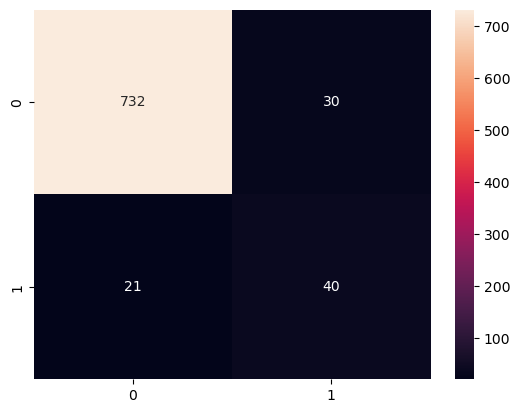

In [10]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(gt_labels["is_night"], gt_labels["preds"])
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

In [11]:
# plot wrong predictions
wrong_preds = gt_labels[gt_labels["is_night"] != gt_labels["preds"]]

wrong_preds.head()

,is_night,name,preds
13166374145_92be8272ee_b.jpg,False,13166374145_92be8272ee_b.jpg,1
14377906154_bb411546ef_o.jpg,False,14377906154_bb411546ef_o.jpg,1
14418910025_c0e3a272cb_o.jpg,False,14418910025_c0e3a272cb_o.jpg,1
15277468483_b1425de0cd_b.jpg,True,15277468483_b1425de0cd_b.jpg,0
15574308725_ff575f80da_b.jpg,True,15574308725_ff575f80da_b.jpg,0


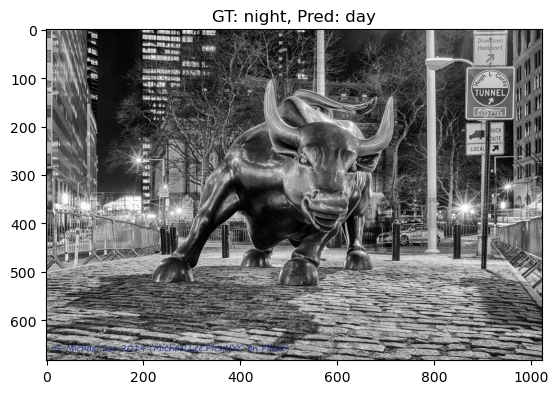

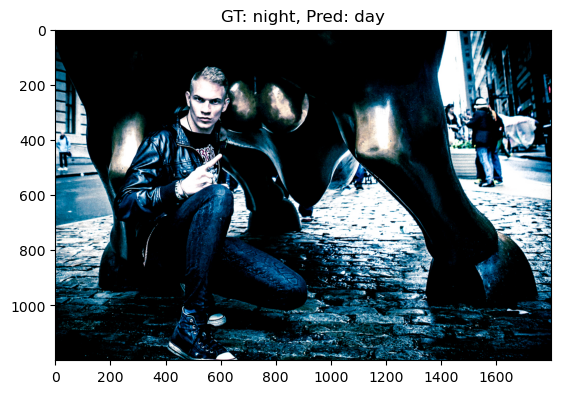

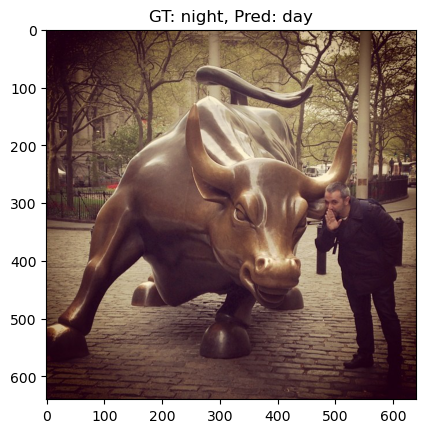

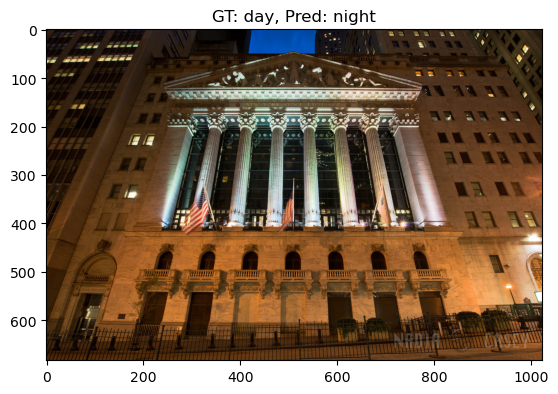

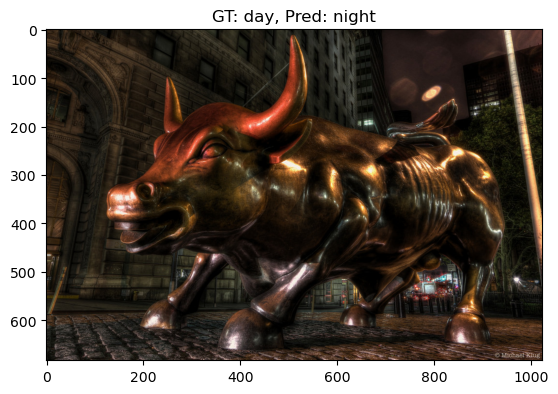

...

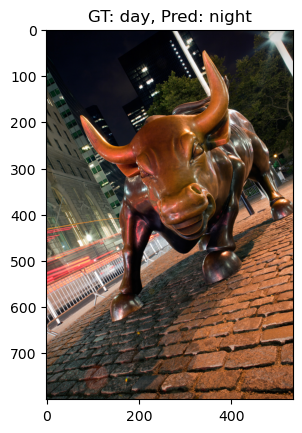

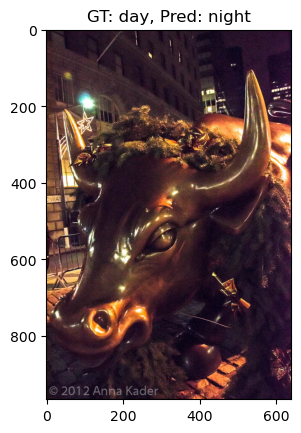

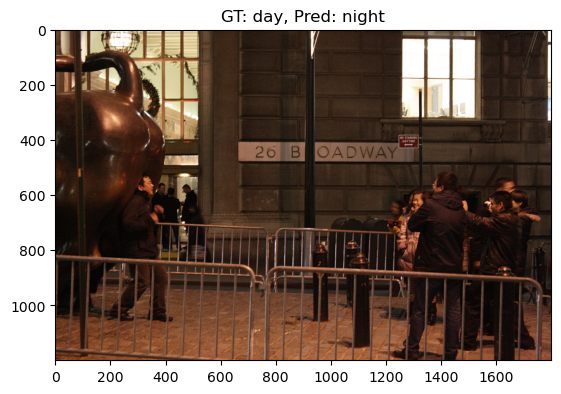

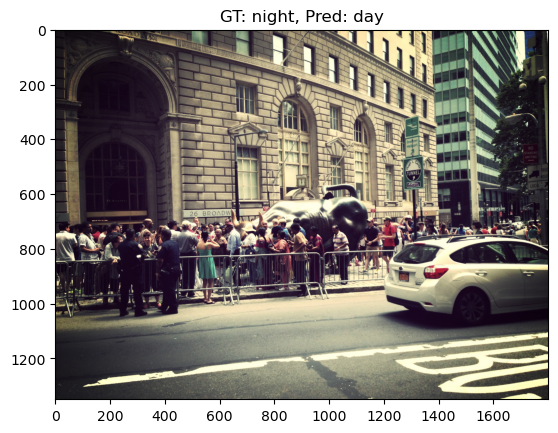

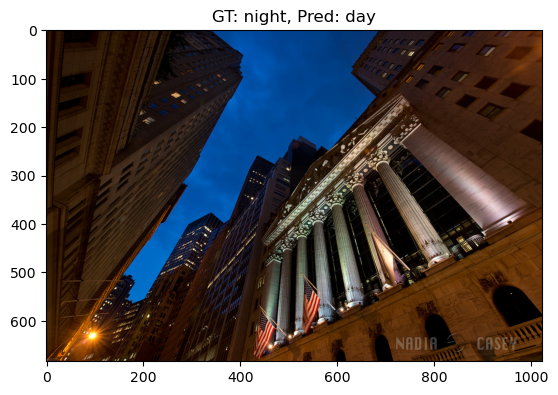

In [12]:
for i, row in wrong_preds.iterrows():
    img_path = os.path.join(image_dir, row["name"])
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    gt_label = "night" if row["is_night"] == 0 else "day"
    pred_label = "night" if row["preds"] == 0 else "day"
    plt.title(f"GT: {gt_label}, Pred: {pred_label}")
    plt.show()